In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install wandb
import wandb
import os
import pathlib
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.python.framework import ops
import keras.backend as K
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid

     |████████████████████████████████| 2.1MB 19.0MB/s 
     |████████████████████████████████| 102kB 13.9MB/s 
     |████████████████████████████████| 163kB 52.4MB/s 
     |████████████████████████████████| 133kB 53.4MB/s 
     |████████████████████████████████| 71kB 11.9MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-cp37-none-any.whl size=6489 sha256=eba14a04403967c03780c6296c13fd2ba0545d06a05cd711921448886f3192f9
  Stored in directory: /root/.cache/pip/wheels/68/39/1a/5e402bdfdf004af1786c8b853fd92f8c4a04f22aad179654d1
  Created wheel for pathtools: filename=pathtools-0.1.2-cp37-none-any.whl size=8786 sha256=63c3fbf4bb91408c3615f9f5f3f8434cf0d256444af2e172a4b38dafa58d0147
  Stored in directory: /root/.cache/pip/wheels/0b/04/79/c3b0c3a0266a3cb4376da31e5bfe8bba0c489246968a68e843
Successfully built subprocess32 pathtools


# Preparing the training and test datasets

In [ ]:
####################################################################
# Preparing training set (without augmentation) and validation set
####################################################################
# Preparing training data without augmentation
# Loading data from directory
data_dir = pathlib.Path('/content/drive/MyDrive/inaturalist_12K/train') # Set path to the right directory
train_data = tf.keras.preprocessing.image_dataset_from_directory(
                      directory = data_dir,
                      labels = 'inferred',  
                      label_mode = 'categorical',
                      color_mode = 'rgb',
                      batch_size = 32,
                      image_size = (256, 256),
                      shuffle = True,
                      seed = 17,
                      validation_split = 0)

# Retaining 25 percent of train data and discarding the rest
len_train = len(train_data)
train_data = train_data.take(int(0.25*len_train))

Found 10000 files belonging to 10 classes.


In [ ]:
################################################################
# Preparing training set with augmentation 
################################################################
train_data_augmenter = ImageDataGenerator(
                            rescale = None,
                            rotation_range = 20,
                            width_shift_range = 0.2,
                            height_shift_range = 0.2,
                            brightness_range = [0.2, 1.5],
                            shear_range = 0.2,
                            zoom_range = 0.2,
                            horizontal_flip=True,
                            data_format = 'channels_last',
                            validation_split = 0)      #Specifying parameters for augmentation of training data



train_aug_gen = train_data_augmenter.flow_from_directory(data_dir, shuffle = True, seed = 17)

train_aug_data = tf.data.Dataset.from_generator(
                    lambda: train_aug_gen,
                    output_types = (tf.float32, tf.float32),
                    output_shapes = ([None, 256, 256, 3], [None, 10]))

train_aug_data = train_aug_data.take(int(0.25*len_train))

Found 10000 images belonging to 10 classes.


In [ ]:
###################################################
# Reading the test data
###################################################
test_data_dir = pathlib.Path('/content/drive/MyDrive/inaturalist_12K/val') # Set path to the right directory
test_data = tf.keras.preprocessing.image_dataset_from_directory(
                      directory = test_data_dir,
                      labels = 'inferred',  
                      label_mode = 'categorical',
                      color_mode = 'rgb',
                      batch_size = 32,
                      image_size = (256, 256),
                      shuffle = False,
                      seed = 17,
                      validation_split = 0)

print(len(test_data)) # Number of batches

Found 2000 files belonging to 10 classes.
63


# Specifying the hyperparameters

In [ ]:
###################################################
# Optimal hyperparameters can be specified here
###################################################
optimal = {
              'first_layer_filters': 64,
              'filter_org': 1, # Same number of filters in all convolution layers
              'data_aug': True,
              'batch_norm': True, 
              'dropout': 0.2,
              'kernel_size': 3,
              'dense_size': 128,
              'activation': 'relu',
              'num_epochs': 50, 
              'optimizer': 'adam',
              'conv_layers': 5
          }

# Defining the model architecture

In [ ]:
#####################################################################
# Initializing the model architecture with optimal hyperparameters
#####################################################################
inputs = tf.keras.Input(shape = (256, 256, 3))
x = Rescaling(scale = 1.0/255)(inputs)
filter_sizes = [int(optimal['first_layer_filters']*(optimal['filter_org']**layer_num)) 
                for layer_num in range(optimal['conv_layers'])]
ker_size = optimal['kernel_size']

# Apply some convolution and pooling layers
for layer_num in range(optimal['conv_layers']):
    x = layers.Conv2D(filters = filter_sizes[layer_num], kernel_size = (ker_size, ker_size))(x)
    if optimal['batch_norm']:
        x = layers.BatchNormalization(axis = -1)(x)
    x = layers.Activation(optimal['activation'])(x)
    x = layers.MaxPooling2D(pool_size = (2, 2))(x)            
               
# Dense Layer
x = layers.Flatten()(x)
x = layers.Dense(optimal['dense_size'])(x)
if optimal['batch_norm']:
    x = layers.BatchNormalization(axis = -1)(x)
x = layers.Activation(optimal['activation'])(x)
if optimal['dropout'] > 0:
    x = layers.Dropout(rate = optimal['dropout'])(x)        

# Output Layer
outputs = layers.Dense(10, activation ='softmax')(x)
model = tf.keras.Model(inputs = inputs, outputs = outputs)
print(model.summary())
        
model.compile(optimizer = optimal['optimizer'],
              loss = tf.keras.losses.CategoricalCrossentropy(name = 'loss'),
              metrics = [tf.keras.metrics.CategoricalAccuracy(name = 'acc')])

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
rescaling (Rescaling)        (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 254, 254, 64)      1792      
_________________________________________________________________
batch_normalization (BatchNo (None, 254, 254, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 254, 254, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 64)      36928 

# Training the model and evaluating on test data

In [ ]:
# Using training data with or without augmentation
train_data_use = train_aug_data if optimal['data_aug'] else train_data
# Training the model
model_hist = model.fit(train_data_use, epochs = optimal['num_epochs'],
                       callbacks = [tf.keras.callbacks.EarlyStopping(monitor = 'acc', patience = 5)])

Epoch 1/50
78/78 [==============================] - 1306s 16s/step - loss: 2.4660 - acc: 0.1422
Epoch 2/50
78/78 [==============================] - 1286s 16s/step - loss: 2.2917 - acc: 0.1751
Epoch 3/50
78/78 [==============================] - 1347s 17s/step - loss: 2.2436 - acc: 0.1861
Epoch 4/50
78/78 [==============================] - 1289s 17s/step - loss: 2.1805 - acc: 0.2092
Epoch 5/50
78/78 [==============================] - 99s 1s/step - loss: 2.1808 - acc: 0.1911
Epoch 6/50
78/78 [==============================] - 92s 1s/step - loss: 2.1154 - acc: 0.2308
Epoch 7/50
78/78 [==============================] - 91s 1s/step - loss: 2.1415 - acc: 0.2330
Epoch 8/50
78/78 [==============================] - 91s 1s/step - loss: 2.1440 - acc: 0.2258
Epoch 9/50
78/78 [==============================] - 90s 1s/step - loss: 2.0800 - acc: 0.2560
Epoch 10/50
78/78 [==============================] - 90s 1s/step - loss: 2.0616 - acc: 0.2585
Epoch 11/50
78/78 [==============================] - 90s 

In [ ]:
# Saving the model
model.save(pathlib.Path('/content/drive/MyDrive/DL_Assignment2_PartA_Model'))

INFO:tensorflow:Assets written to: /content/drive/MyDrive/DL_Assignment2_PartA_Model/assets


In [ ]:
# Loading the saved model (Also required for Q4 (b), Q4 (c) and Q5)
model = tf.keras.models.load_model(pathlib.Path('/content/drive/MyDrive/DL_Assignment2_PartA_Model'))

In [ ]:
# Evaluating the model on the test set
result = model.evaluate(test_data)
print(result)
print(model.metrics_names)

63/63 [==============================] - 614s 9s/step - loss: 1.9376 - acc: 0.3170
[1.9375505447387695, 0.31700000166893005]
['loss', 'acc']


# Q4) (b) Grid of Sample Images showing True Labels and Predictions


In [ ]:
wandb.init()

['Amphibia', 'Animalia', 'Arachnida', 'Aves', 'Fungi', 'Insecta', 'Mammalia', 'Mollusca', 'Plantae', 'Reptilia']


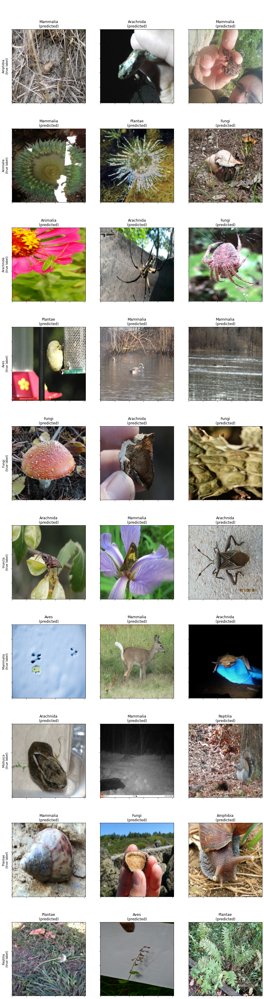

In [ ]:
# Plotting 10 * 3 grid showing true 
labels_list = sorted(os.listdir(test_data_dir))
print(labels_list)
class_count = 0
# Choosing images from all ten classes
batches_show = [0, 7, 13, 19, 25, 32, 38, 42, 48, 55]
fig, axs = plt.subplots(10, 3, figsize = (15, 60))
for batch_count, (data, label) in enumerate(test_data):
    if batch_count in batches_show:
        axs[class_count, 0].set(ylabel = '{}\n(true label)'.format(labels_list[class_count]))
        for i in range(3):
            predicted_lab = labels_list[np.argmax(model.predict(np.array(data[i,:,:,:]).reshape(1, 256, 256, 3)))]
            axs[class_count, i].imshow(np.array(data[i,:,:,:], dtype = np.int32))
            axs[class_count, i].set_title('\n\n\n\n{}\n(predicted)'.format(predicted_lab))
            axs[class_count, i].set_yticklabels([])
            axs[class_count, i].set_xticklabels([])
        class_count += 1
    batch_count += 1
wandb.log({'img': [wandb.Image(fig)]})

# Visualizing the filters in the first layer

In [ ]:
wandb.init()

_runtime,104
_timestamp,1618399450
_step,0


_runtime,▁
_timestamp,▁
_step,▁


41 23
(256, 256, 3)
(1, 254, 254, 64)


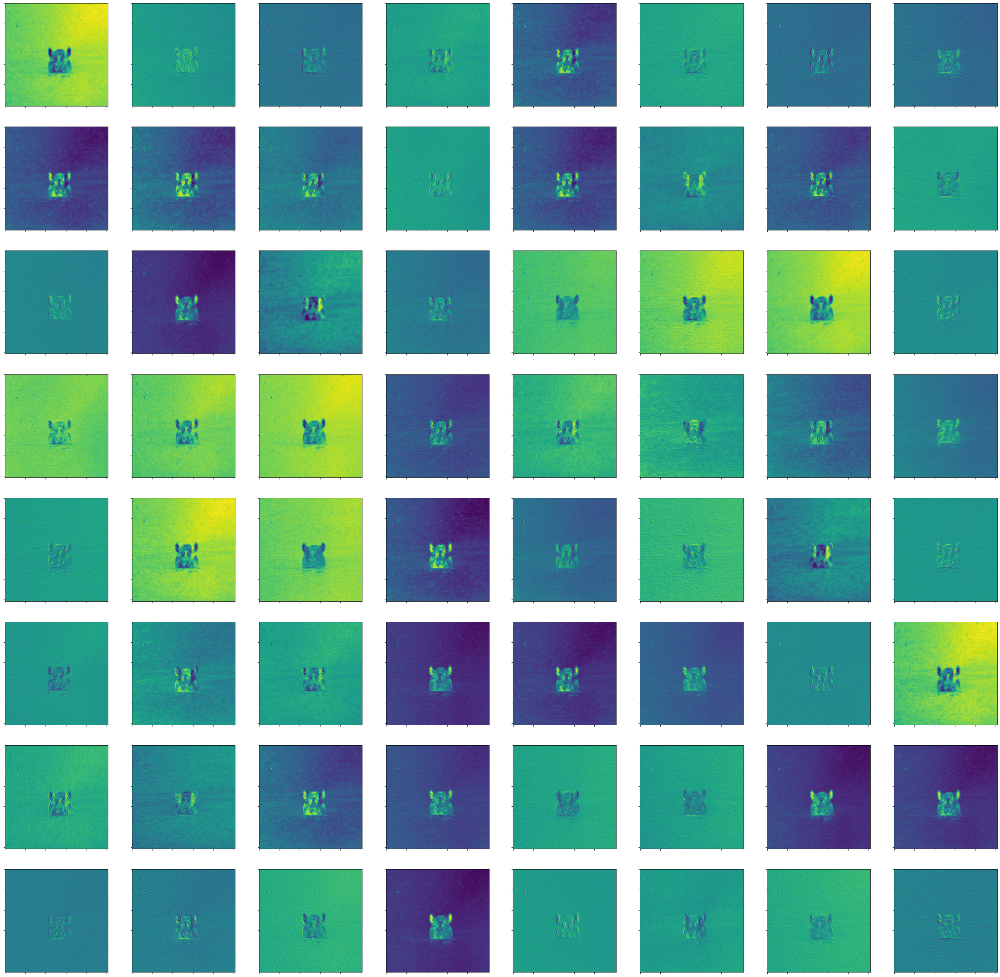

In [ ]:
model_first_conv = tf.keras.models.Model(inputs = model.inputs, outputs = model.layers[2].output) #Taking the output of the first convolution layer
batch_random, img_random = np.random.randint(62), np.random.randint(32) # Random image from test dataset
print(batch_random, img_random)
img_visualize = np.array((256, 256, 3))
for batch_ind, (data, _) in enumerate(test_data):
    if batch_ind == batch_random:
        img_visualize = np.array(data[img_random,:,:,:])

print(img_visualize.shape)
filter_visualize = np.array(model_first_conv.predict(np.array(img_visualize).reshape(1,256,256,3)))
print(filter_visualize.shape)
fig, axs = plt.subplots(8, 8, figsize = (40, 40))
for filter_num in range(64):
    axs[int(filter_num/8), filter_num%8].imshow(filter_visualize[0,:,:,filter_num])
    axs[int(filter_num/8), filter_num%8].set_yticklabels([])
    axs[int(filter_num/8), filter_num%8].set_xticklabels([])

wandb.log({'Original Image': [wandb.Image(img_visualize)]})
wandb.log({'Visualized filters for first convolution layer': [wandb.Image(fig)]})